In [7]:
from random import shuffle
from glob import glob
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
%matplotlib inline

In [40]:
test_file_path= "/work/vq218944/MSAI/ExDarkVOC/ImageSets/Main/test.txt"
with open(test_file_path, "r") as fp:
    file_list = fp.read().splitlines()
shuffle(file_list)
file_list = file_list[:10]

print(file_list)

['2015_04362', '2015_01235', '2015_03034', '2015_06201', '2015_01844', '2015_06212', '2015_00453', '2015_01789', '2015_02374', '2015_07310']


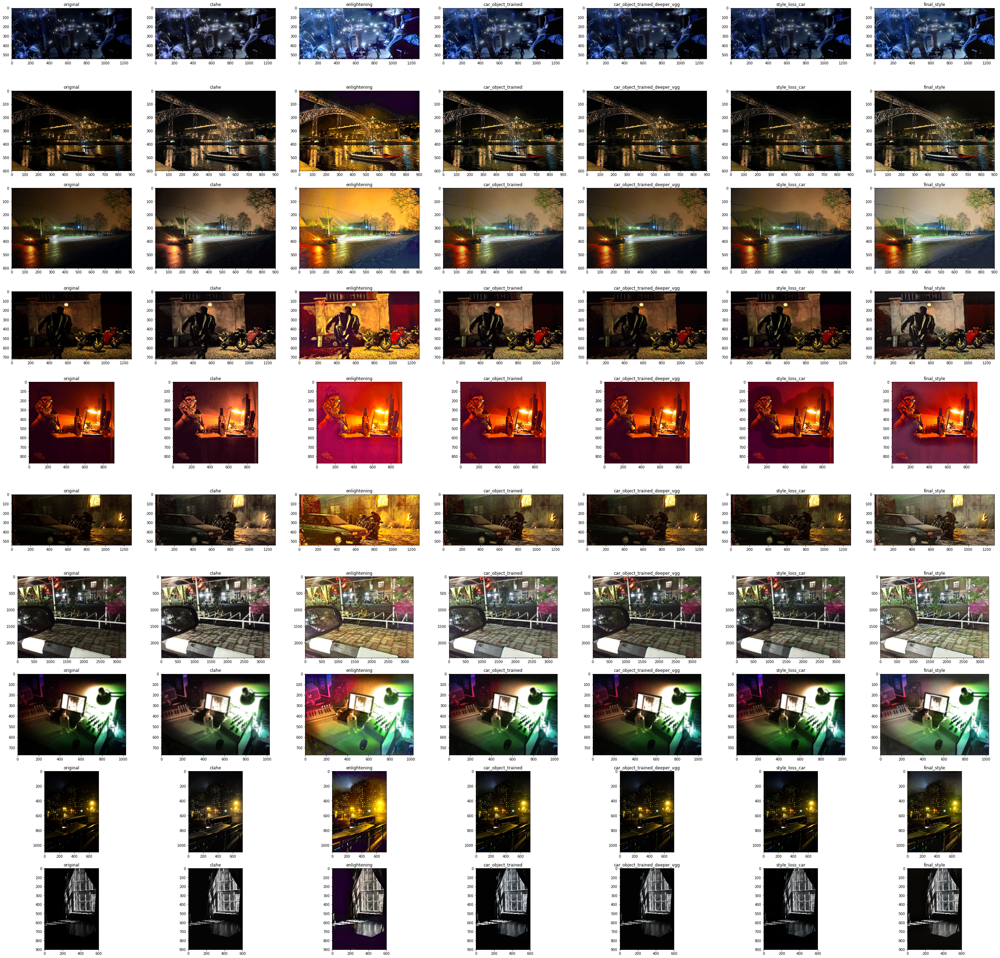

In [42]:
models = ["original", "clahe", "enlightening", "car_object_trained", "car_object_trained_deeper_vgg", "style_loss_car", "final_style"]
f, ax = plt.subplots(len(file_list),len(models), figsize=(50, 50))

for row_idx, path in enumerate(file_list):
    for col_idx, model in enumerate(models):
        if model == "original":
            fn = os.path.join("ablation", "enlightening", "test_latest", "images", path + "_real_A.png")
            pil_im = Image.open(fn, 'r')
            ax[row_idx, col_idx].imshow(np.asarray(pil_im)) 
            ax[row_idx, col_idx].set_title(model)
            pil_im.save('original_{}.png'.format(row_idx))
            continue
            
        for fn in glob("{}/*".format(os.path.join("ablation", model, "test_latest", "images"))):
            if path in fn and 'fake' in fn:

                pil_im = Image.open(fn, 'r')
                ax[row_idx, col_idx].imshow(np.asarray(pil_im)) 
                ax[row_idx, col_idx].set_title(model)
                pil_im.save('{}_{}.png'.format(model, row_idx))

plt.show()